# Introdução

Objetivos:

- Entender os conceitos de vetores espaciais para sistemas trifásicos.
- Aplicar o conceito de vetores espaciais para separar componentes de harmônicos e desequilibrados.
- Utilizar o conceito de vetores espaciais em sistemas monofásicos (Defasagem de $\pi/4$).
- Utilizar o conceito de modulação para aplicação de vetores espaciais em sistemas DC.

## Importanto bibliotecas importantes

In [1]:
# Pacote de cálculo numérico
import numpy as np

# Pacote de sinais
from scipy import signal

# Pandas
import pandas as pd

# Interpolação
import scipy.interpolate as interpolate

# Pacote de plot
import matplotlib.pyplot as plt
import matplotlib.ticker as tck

#Gráficos com multicores
from matplotlib.collections import LineCollection

#Animação
from matplotlib.animation import FuncAnimation

#Colormap
import matplotlib.colors as colors
import matplotlib as mpl

# Aumentando o limite de memória kkkk
mpl.rcParams['animation.embed_limit'] = 2**32

#Saída do IPython
from IPython import display

#Widgets e grids
import ipywidgets as widgets

#Avisos e erros
import warnings

## Classes e funções auxiliares

### class Plots

Classe de apoio para plotar de forma customizada.

In [2]:
class Plots:
    def __init__(self,y,figsize=(15,4),T=1000,tam=1):
        self.tam=tam
        self.figsize=figsize
        self.T=T
        if self.tam>1:
            self.fig, self.axs = plt.subplots(self.tam,figsize=(figsize[0],figsize[1]*self.tam))
        else:
            self.fig, self.axs = plt.subplots(figsize=figsize)
        self.time= np.arange(0,y.size)/T*2;
    def plotAjustment(self,ax,i,radians=True,step=1):
        time=self.time;
        dt=time[1]-time[0];
        
        piY=False
        if radians:
            tol=1e-4
            iM=i.max()*100
            im=i.min()*100
            diff = lambda x: abs(np.ceil(x)-x)

            if (diff(iM)>tol and diff(iM*np.pi)<tol) or (diff(im)>tol and diff(im*np.pi)<tol):
                i*=np.pi
                i=np.round(i,4)
                piY=True
        ax.grid(True);
        
        ax.set_xticks(np.arange(0,time[-1]+step+2*dt,step));
        ax.set_xlim(0,time[-1]+dt);
        dmax=i.max()-i.min();
        ax.set_ylim(i.min()-dmax*0.1,i.max()+dmax*0.1);
        ax.set_yticks(np.linspace(i.min(),i.max(),9));
        if radians:
            ax.xaxis.set_major_formatter(tck.FormatStrFormatter('%g$\pi$'));
        if piY:
            ax.yaxis.set_major_formatter(tck.FormatStrFormatter('%g$\pi$'));
        ax.set_ylabel('Amplitude');
        ax.set_xlabel('Tempo');

Plota uma grandeza trifásica:

In [3]:
def plotRST(v,args=dict(),label='v',title=''):
    p=Plots(v["r"],**args)
    p.axs.plot(p.time,v["r"],'r',label=fr'${label}_r(t)$');
    p.axs.plot(p.time,v["s"],'g',label=fr'${label}_s(t)$');
    p.axs.plot(p.time,v["t"],'b',label=fr'${label}_t(t)$');
    p.axs.legend(loc=1);
    p.plotAjustment(p.axs,v["r"],step=0.2);
    if title:
        p.axs.set_title(title);
    return p

Soma duas grandezas trifásicas:

In [4]:
def addRST(v1,v2):
    return {"r":v1["r"]+v2["r"],"s":v1["s"]+v2["s"],"t":v1["t"]+v2["t"]}

### class VecSpace

Classe de apoio para trabalhar com vetores espaciais

In [5]:
def rst2ab(v):
    return ((v["r"]+v["s"]*np.e**(1j*2*np.pi/3)+v["t"]*np.e**(-1j*2*np.pi/3))*2/3).astype(complex)

def ab2dq(v,theta,omega=1,vref={}):
    if vref:
        theta=np.angle(rst2ab(vref))
    return np.abs(v)*np.exp(1j*(np.angle(v)-omega*theta))

def ab2rst(v):
    return {"r":np.real(v),
            "s":-0.5*np.real(v)+np.sqrt(3)/2*np.imag(v),
            "t":-0.5*np.real(v)-np.sqrt(3)/2*np.imag(v),
           }

In [6]:
class VecSpace:
    def __init__(self,v,theta,T=1000,hs=dict(),velLim=20,velNonLinear=True,vref={},origem=False,limiar=0.95):
        self.ab=rst2ab(v)
        self.omega=0 #Velocidade de rotação do referencial
        self.T=T #Período
        self.angle=0 #Ângulo de rotação
        self.theta=theta #Argumento no sistema rst
        self.hs=hs
        self.h=list(hs.keys())
        self.velLim=velLim
        self.NonLinear=velNonLinear
        self.vref=vref
        self.cycles=int(self.ab.size/T)
        self.origem=origem
        self.limiar=limiar
        
    # Métodos privados
    
    def park(self,omega=1):
        if self.vref:
            theta=np.angle(rst2ab(self.vref))
        else:
            theta=self.theta
        self.ab*=np.exp(-1j*omega*theta)
        if self.hs:
            for h in self.h:
                self.hs[h]*=np.exp(-1j*omega*theta)
        self.angle+=omega
#         if omega==1 and self.vref:
#             self.theta=theta
    
    def ajustmentLG(self,ax):
        Amax=np.abs(self.ab).max()
        ax.vlines(0,-2*Amax,2*Amax,colors='silver',zorder=-1001);
        ax.hlines(0,-2*Amax,2*Amax,colors='silver',zorder=-1002);
        ax.set_aspect('equal', 'box');
        ax.set_xlim(-1.1*Amax,1.1*Amax);
        ax.set_ylim(-1.1*Amax,1.1*Amax);
        ax.grid(True);
        if self.NonLinear:
            if self.omega==0:
                ax.set_xlabel(r'Eixo $\alpha$');
                ax.set_ylabel(r'Eixo $\beta$');
            else:
                ax.set_xlabel('Eixo $d$');
                ax.set_ylabel('Eixo $q$');
                
    def calcAngle(self,V):
        a = np.angle(V,deg=True)
        a[a<0]+=360
        for k in range(1,a.size):
            if abs(a[k-1]-a[k])>360*self.limiar:
                a[k:]+=360*np.round((a[k-1]-a[k])/np.abs(a[k-1]-a[k]))
        #a[np.abs(V)==0]+=360
        return a
            
    def velAngular(self):
        vel = np.zeros(self.ab.size)
        self.relativeAngle = np.zeros(self.ab.size)
        for c in range(self.cycles):
            if self.origem:
                centro = 0
            else:
                centro = (self.ab[c*self.T:(c+1)*self.T]).mean().round(2)
            V = (self.ab[c*self.T:(c+1)*self.T])-centro
            self.relativeAngle[c*self.T:(c+1)*self.T]=self.calcAngle(V)

            # Adaptando o ângulo para ser sempre crescente na direção anti-horária
            vel[c*self.T:(c+1)*self.T] = np.round(np.gradient(self.relativeAngle[c*self.T:(c+1)*self.T])*self.T/360,decimals=2)

        #limitando a velocidade máxima em \pm 20
        vel[vel>self.velLim]=self.velLim
        vel[vel<-self.velLim]=-self.velLim
        
#         if self.origem:
#             vel=np.abs(vel)
        
        return vel
    
    def criarSegmentos(self,lim=-1):
        # Segmentos controlados de forma individual:
        # Array do tipo: (NumSegmentos) x (Pontos por segmento) x 2 (x e y)
        pontos = np.array([np.real(self.ab[0:lim]), np.imag(self.ab[0:lim])]).T.reshape(-1, 1, 2)
        # os segmentos são formados por array x[k] e x[k+1] (Concatenação para isso)
        return np.concatenate([pontos[:-1], pontos[1:]], axis=1)
    
    def scaleColor(self,vec):
        if self.NonLinear:
            vec=self.velLim*np.arctan(vec/4)/np.arctan(5)
        return vec
            
    # Métodos públicos
    
    def plotLGSimple(self,fig,ax,args=dict(),colorbar=True,showAxis=False):
        # Criando a coleção de linhas
        clim=self.velLim
        lc = LineCollection(self.criarSegmentos(), cmap='jet', norm=plt.Normalize(-self.velLim, self.velLim),lw=2)
        
        #Adicionando a velocidade no eixo
        lc.set_array(self.scaleColor(self.velAngular()))
        
        #Plotando o gráfico
        line = ax.add_collection(lc);

        # Adicionando colorbar
        if colorbar:
            cbar=fig.colorbar(line, ax=ax)
            if self.NonLinear:
                Interval=np.array([-20,-10,-5,-3,-2,-1,0,1,2,3,5,10,20]).astype(int)
                cbar.set_ticks(self.scaleColor(Interval))
                cbar.ax.set_yticklabels(Interval)
            if self.origem:
                cbar.set_label('Velocidade angular em relação a origem', rotation=270)
            else:
                cbar.set_label('Velocidade angular', rotation=270)
        
        # Adicionado ponto caso a trajetória não exista
        if self.ab.mean().round(2)==self.ab[0].round(2):
            jet=plt.get_cmap('jet')
            m=interpolate.interp1d([-self.velLim,self.velLim],[0,1]) # Mudança de escala
            vel = (self.velAngular()).mean()
            ax.scatter(np.real(self.ab),np.imag(self.ab),color=jet(m(vel)),s=9)
        
        #Customizações finais
        self.ajustmentLG(ax);
    
    def plotLG(self,title=''):
        """
        Plotar no lugar geométrico
        """
        fig, ax = plt.subplots(figsize=(7,6));
        
        self.plotLGSimple(fig,ax)
        
        if title!='':
            ax.set_title(title);
        
        return fig, ax
    
    def comet(self,title='',frameskip=4,velMean=False,elip=False):
        """
        Plota animação do lugar geométrico
        """
        fig, ax = plt.subplots(figsize=(7,6));       
        
        # Incluindo harmônicas
        if self.hs:
            qh=dict()
            
            o=0.0 #Origem do vetor
            for i,h in enumerate(self.h):
                e=self.hs[h][0] #Fim do vetor
                if h==1:
                    param={'color':'salmon'}
                elif h==-1:
                    param={'color':'dimgray'}#'darkturquoise'
                else:
                    param={'color':'dimgray'}
                qh[h]=ax.quiver(np.real(o),np.imag(o), np.real(e), np.imag(e), 
                      angles='xy', scale_units='xy',width=0.005-h*0.0001,
                      scale=1,headwidth=3,headlength=4,**param)
                if h>=50:
                    break
                o+=e
            
        # Resultante
        q = ax.quiver(*np.array([0,0]), np.real(self.ab[0]), np.imag(self.ab[0]), 
                      color='k', angles='xy', scale_units='xy', 
                      scale=1,headwidth=3,headlength=6,width=0.005)#,zorder=1001 (Se necessário coloca o vetor na frente)
        
        if self.hs: #Legenda
            if -1 in self.h:
                labels=["Resultante", "Seq. Positiva","Seq. Negativa"]
            else:
                labels=["Resultante", "Fundamental","Harmônicas"]
            hs=list(qh.keys())
            plt.legend([q, qh[1],qh[hs[-1]]],labels,
                       bbox_to_anchor=(0.5, -0.2), loc='lower center',ncol=3)#, borderaxespad=0.
        
        # Trajetória
        
        lc = LineCollection([], cmap='jet', norm=plt.Normalize(-self.velLim, self.velLim),lw=2)
        
        #Adicionando a velocidade no eixo
        lc.set_array(self.scaleColor(self.velAngular()));
        
        #Plotando o gráfico
        line = ax.add_collection(lc);
        
        #Informações extra
        title_ = ax.text(0.015,0.95, "", bbox={'facecolor':'w', 'alpha':0.5, 'pad':1},
                transform=ax.transAxes, ha="left")
        
        #Colorbar

        cbar=fig.colorbar(line, ax=ax)
        if self.NonLinear:
            Interval=np.array([-20,-10,-5,-3,-2,-1,0,1,2,3,5,10,20]).astype(int)
            cbar.set_ticks(self.scaleColor(Interval))
            cbar.ax.set_yticklabels(Interval)
        else:
            vlim=int(np.floor(self.velLim))
            cbar.set_ticks(np.linspace(-vlim,vlim,vlim*2+1))
            
        if self.origem:
            cbar.set_label('Velocidade angular em relação a origem', rotation=270)
        else:
            cbar.set_label('Velocidade angular', rotation=270)
        
        #Customizações finais
        self.ajustmentLG(ax);
        
        if title!='':
            ax.set_title(title);
        
        
        # Velocidade (informação extra)
        Vel=self.velAngular()
        Vel[np.abs(Vel)<0.1]=0
        if velMean:
            Vel=np.ones(Vel.shape)*Vel.mean()
        
        title_.set_text(fr"Vel: {np.round(Vel[0],1)} Âng.: {int(np.round(self.relativeAngle[0]))}º")
        
        #Função Plot elip
        if elip:
            def getElip(k):
                origin=np.zeros(self.hs[1].shape).astype(complex)
                for w in range(k):
                    origin+=self.hs[hs[w]]
                elipTrajectory=self.hs[hs[k]]+self.hs[hs[k+1]]
                
                return {"o":origin, "t":elipTrajectory}
            
            elipse={1:getElip(1),3:getElip(3)}
            
            e1, =ax.plot([],[],color="dimgray",linestyle="-.",lw=0.2,alpha=0.3)
            e3, =ax.plot([],[],color="dimgray",linestyle="-.",lw=0.2,alpha=0.3)
            
            def updateElip(elipse,l,frame):
                tam = self.ab.size
                if frame<tam/3:
                    trajetory=elipse["t"][0:int(tam/6)]
                elif frame>=tam/3 and frame <tam*2/3:
                    trajetory=elipse["t"][int(tam/3):int(tam/3+tam/6)]
                else:
                    trajetory=elipse["t"][int(2*tam/3):int(2*tam/3+tam/6)]
                o=elipse["o"][frame]
                l.set_data(np.real(o+trajetory),np.imag(o+trajetory))
        
        #Função de frame
        def animate(frame):
            # Movimentando o vetor resultante
            q.set_offsets(np.array([0, 0]))
            q.set_UVC(np.real(self.ab[frame]),np.imag(self.ab[frame]))
            
            # Informação extra
            title_.set_text(fr"Vel: {np.round(Vel[frame],1)} Âng.: {int(np.round(self.relativeAngle[frame]))}º")
            
            ## Movimentando as harmônicas
            if self.hs:
                
                o=0.0 #Origem do vetor
                for i,h in enumerate(hs):
                    e=self.hs[h][frame] #Fim do vetor
                    qh[h].set_offsets(np.array([np.real(o),np.imag(o)]))
                    qh[h].set_UVC(np.real(e),np.imag(e))
                    o+=e
                    
                if elip:
                    updateElip(elipse[1],e1,frame)
                    updateElip(elipse[3],e3,frame)
            
            # Atualizando a trajetória
            line.set_segments(self.criarSegmentos(frame))
        
        #Animar
        anim = FuncAnimation(fig, animate, frames=np.arange(0,self.ab.size,frameskip).astype(int), interval=20)
        html = display.HTML(anim.to_jshtml())
        display.display(html)
        fig.tight_layout()
        plt.close()
        
    def cometLG(self,vec_name,args=dict()):
        """
        Mostra o lugar das raízes e sua animação, lado a lado
        """
        out1 = widgets.Output()
        out2 = widgets.Output()

        with out1:
            fig, ax = self.plotLG(f'Lugar geométrico de {vec_name}');
            plt.close()
            display.display(fig)

        with out2:
            self.comet(f'Animação de {vec_name}',**args)

        grid = widgets.GridspecLayout(15,2)
        grid[1:,1]=out1
        grid[:,0]=out2
        display.display(grid)

# Sinais trifásicos equilibrados

## Domínio do tempo

Primeiramente iremos criar um sinal trifásico equilibrado de frequência positiva e amplitude unitária:

$$
\vec{v}_{rst}(t)=\begin{cases}
v_r(t)=\cos(\omega t + \phi)\\
v_s(t)=\cos(\omega t + \phi-2\pi/3)\\
v_t(t)=\cos(\omega t + \phi+2\pi/3)
\end{cases}
$$

onde $\phi=\pi/3$.

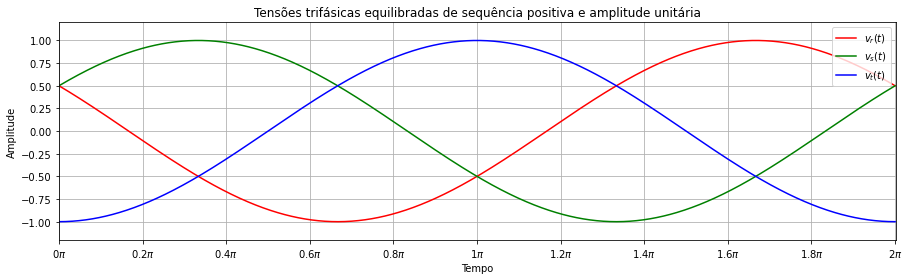

In [7]:
# Gera escala horizontal (Em radianos)
theta=np.arange(0,1001)/1000*2*np.pi
# Calcula vr(t), vs(t) e vt(t)
phi=np.pi/3
v={"r":np.cos(theta+phi),"s":np.cos(theta+phi-2*np.pi/3),"t":np.cos(theta+phi+2*np.pi/3)}
# Plotar vr(t), vs(t) e vt(t)
plotRST(v,title='Tensões trifásicas equilibradas de sequência positiva e amplitude unitária');

Depois calculamos o vetor espacial associado a $\vec{v}_{rst}(t)$ utilizando a classe `VecSpace`:
$$
\vec{v}_{\alpha\beta}=\frac{2}{3}\left(v_r(t)+v_s(t)e^{j2\pi/3}+v_t(t)e^{-j2\pi/3}\right)
$$

## Referencial estacionário

Inicialmente ciramos o objeto de vetor espacial:

In [8]:
# O cálculo da equação acima foi feito através do construtor da classe
V=VecSpace(v,theta,origem=True)

E plotamos o lugar geométrico deste vetor espacial através do método `plotLG()` da classe `VecSpace`:

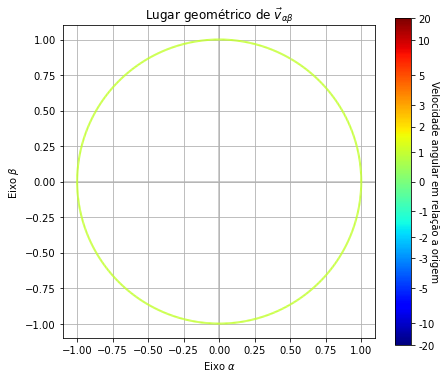

In [9]:
V.plotLG(r'Lugar geométrico de $\vec{v}_{\alpha\beta}$');

Podemos criar uma animação do vetor espacial através do método `comet` da classe `VecSpace`:

In [10]:
V.comet(r'Animação de $\vec{v}_{\alpha\beta}$')

Finalmente, podemos mostrar o lugar geométrico e sua animação em uma única figura através do método `cometLG`:

In [11]:
V.cometLG(r'$\vec{v}_{\alpha\beta}$')

GridspecLayout(children=(Output(layout=Layout(grid_area='widget001')), Output(layout=Layout(grid_area='widget0…

**Explicação:**

A figura obtida é um círculo de raio $1$ que gira numa velocidade (Derivada angular) de 1 cíclo por segundo, no sentido anti-horário. 

O raio representa a amplitude do vetor espacial, que também é a amplitude do sinal trifásico, que é equilibrado e sem harmônicos.

## Referencial síncrono da fundamental

No sistema $dq$:

In [12]:
V.park()

Visualizando:

In [13]:
V.cometLG(r'$\vec{v}_{dq}$')

GridspecLayout(children=(Output(layout=Layout(grid_area='widget001')), Output(layout=Layout(grid_area='widget0…

**Explicação:**

No sistema $dq$ mudamos para um referencial que gira na mesma velocidade do vetor espacial $\vec{v}_{\alpha\beta}$, assim, em relação a este novo eixo girante $dq$ o vetor espacial $\vec{v}_{dq}$ está parado no espaço, portanto, sua trajetória ao longo do tempo é apenas um ponto que indica a amplitude de a fase inicial de $\phi$:

$$
\vec{v}_{dq}=|V|\angle \phi = 1 \angle \frac{\pi}{3} = 1e^{j\pi/3}
$$

O vetor resultante é apresentado abaixo:

In [14]:
1*np.exp(1j*np.pi/3).round(4)

(0.5+0.866j)

# Inclusão de harmônicas

Agora iremos estudar o efeito da inclusão de harmônicas nos vetores espaciais.

## Domínio do tempo

Vamos calcular as tensões do 20º harmônico, $\vec{v}_{20}$:


$$
\vec{v}_{20,rst}(t)=\begin{cases}
    v_{20,r}(t)=0,1\cos(20\omega t)\\
    v_{20,s}(t)=0,1\cos(20\omega t -2\pi/3)\\
    v_{20,t}(t)=0,1\cos(20\omega t +2\pi/3)
\end{cases}
$$

E somar com a fundamental de $\vec{v}_{rst}$, resultando em , $\vec{v}_{h,rst}$, resultando em:

$$
\vec{v}_{h,rst}(t)=\begin{cases}
    v_{h,r}(t)=v_{20,r}(t)+v_r(t)\\
    v_{h,s}(t)=v_{20,s}(t)+v_s(t)\\
    v_{h,t}(t)=v_{20,t}(t)+v_t(t)
\end{cases}
$$


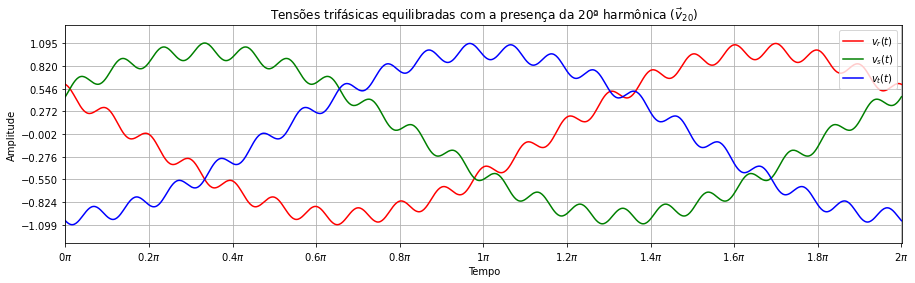

In [15]:
# Calcular as tensões do 20° harmônico
v20={"r":0.1*np.cos(20*theta),"s":0.1*np.cos(20*theta-2*np.pi/3),"t":0.1*np.cos(20*theta+2*np.pi/3)}

# Somar com a fundamental
vh = addRST(v,v20)

# Plotar a onda resultante no domínio do tempo
plotRST(vh,title=r'Tensões trifásicas equilibradas com a presença da 20ª harmônica ($\vec{v}_{20}$)');

## Referencial estacionário

Criando o vetor espacial:

In [16]:
# Is parâmetros extra são para o desenho das harmônicas
Vh=VecSpace(vh,theta,hs={1:rst2ab(v),20:rst2ab(v20)})

E visualizamos o resultado utilizando o método `cometLG()` da classe `VecSpace`:

In [17]:
Vh.cometLG(r'$\vec{v}_{20,\alpha\beta}$ ($\vec{v}$+20ª harmônica)');

GridspecLayout(children=(Output(layout=Layout(grid_area='widget001')), Output(layout=Layout(grid_area='widget0…

**Explicação:**

Neste caso, como houve a 20ª harmônica, a trajetória do sinal não apresentou o formato de um círculo perfeito de raio igual à amplitude de $\vec{v}$. Isto ocorreu pois o vetor da 20ª harmônica tem sua própria amplitude e sua própria velocidade de giro, que é 20 vezes mais rápida que a fundamental, e quando somado à fundamental cria uma leve distorção no sinal. Esta distorção é pequena, pois a fundamental é muito maior que a harmônica.

## Referencial síncrono da fundamental

Mudando para o refencial síncrono com a transformada de Park:

In [18]:
Vh.park()

E visualizamos o resultado utilizando o método `cometLG()` da classe `VecSpace`:

In [19]:
Vh.cometLG(r'$\vec{v}_{20,dq}$',args={"velMean":True});

GridspecLayout(children=(Output(layout=Layout(grid_area='widget001')), Output(layout=Layout(grid_area='widget0…

**Explicação:**

Neste caso, a fundamental vai está em reposo, pois o eixo $dq$ gira colado com a fundamental. Ou seja, a trajetória resultante é apenas da 20ª harmônica, porém com a posição deslocada da origem devido ao vetor espacial da fundamental.

# Efeito da sequência negativa

## A sequência negativa

Vamos considerar um sinal com apenas componente negativa:

$$
\vec{v}_{n,rst}(t)=\begin{cases}
    v_{n,r}(t)=0.3\cos(\omega t)\\
    v_{n,s}(t)=0.3\cos(\omega t+2\pi/3)\\
    v_{n,t}(t)=0.3\cos(\omega t-2\pi/3)
\end{cases}
$$

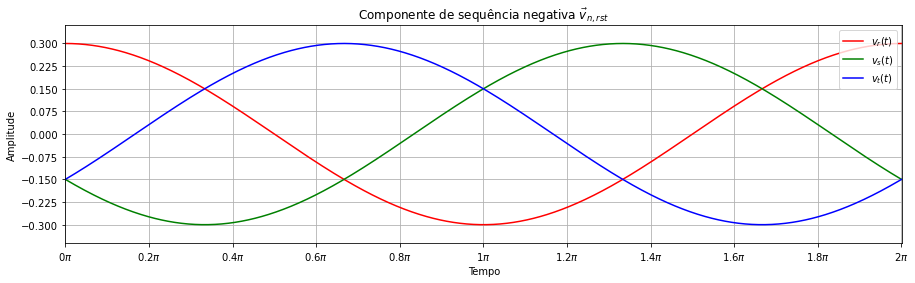

In [20]:
# Criando o sinal
vn={"r":0.3*np.cos(theta),"s":0.3*np.cos(theta+2*np.pi/3),"t":0.3*np.cos(theta-2*np.pi/3)}
# Mostrando o sinal resultante
plotRST(vn,title=r'Componente de sequência negativa $\vec{v}_{n,rst}$');

### Referencial estacionário

Criando o vetor espacial:

In [21]:
Vn=VecSpace(vn,theta)

Visualizando o resultado:

In [22]:
Vn.cometLG(r'$\vec{v}_{n,\alpha\beta}$')

GridspecLayout(children=(Output(layout=Layout(grid_area='widget001')), Output(layout=Layout(grid_area='widget0…

**Explicação:**

Observa-se que o vetor espacial gira no sentido horário com velocidade angular de $-1$. O raio do círculo gerado é de $0,3$ unidades.

### Referencial síncrono da sequência positiva (Fundamental)

Aplicando a transformada de Park:

In [23]:
Vn.park()

Visualizando o resultado:

In [24]:
Vn.cometLG(r'$\vec{v}_{n,dq}$')

GridspecLayout(children=(Output(layout=Layout(grid_area='widget001')), Output(layout=Layout(grid_area='widget0…

**Explicação:**

A transformada de Park faz uma rotação no eixo no sentido contrário ao sentido da fundamental, como a sequência negativa também gira no sentido contrário **a velocidade resultante é dobrada ao no referencial síncrono** totalizando $-2$ de velocidade resultante.

## Sequência negativa + sequência positiva

Agora iremos somar a sequência positiva $\vec{v}$ com a sequência negativa $\vec{v}_{n}$, resultando em $\vec{v}_d$:

$$
\vec{v}_d=\vec{v}+\vec{v}_{n}
$$

ou seja:

$$
\vec{v}_{d,rst}(t)=\begin{cases}
    v_{d,r}(t)=v_{n,r}(t)+v_r(t)\\
    v_{d,s}(t)=v_{n,s}(t)+v_s(t)\\
    v_{d,t}(t)=v_{n,r}(t)+v_t(t)
\end{cases}
$$

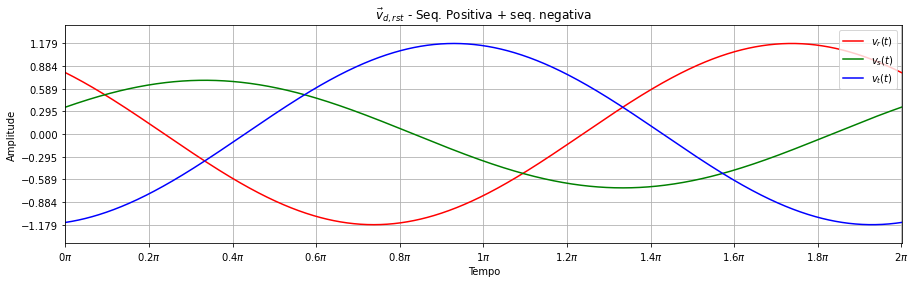

In [25]:
# Definindo os vetores
vd=addRST(v,vn)
# Plotando a resultante
plotRST(vd,title=r'$\vec{v}_{d,rst}$ - Seq. Positiva + seq. negativa');

### Referencial estacionário

Criando o vetor espacial:

In [26]:
Vd=VecSpace(vd,theta,hs={1:rst2ab(v),-1:rst2ab(vn)})

Visualizando o resultado (Apenas a resultante):

In [27]:
Vd.cometLG(r'$\vec{v}_{d,\alpha\beta}$')

GridspecLayout(children=(Output(layout=Layout(grid_area='widget001')), Output(layout=Layout(grid_area='widget0…

**Explicação:**

Ao somar as duas sequências (positiva e negativa) a trajetória resultante é uma elipse, pois as duas componentes estão girando em sentido contrário, assim em certos momentos há uma soma das amplitudes das sequências (Raio maior da elipse) e em certos momentos há uma subtração das duas sequências (Raio menor da elipse).

Esse efeito (Da sequência negativa) provoca uma aceleração do vetor resultante quando se aproxima do ponto de eixo (Raio) menor e uma desaceleração quando o vetor resultante se aproxima do eixo maior. Exatamente no eixo menor a velocidade é máxima e igual a $2$ e exatamente no eixo maior a velocidade é mínima de $1/2$, sempre transitando entre $2$ e $1/2$. A partir disso é possível deduzir o comportamento da aceleração do vetor espacial.

### Referencial síncrono da fundamental (Seq. Positiva)

Aplicando a transformada de Park:

In [28]:
Vd.park()

Resulta em:

In [ ]:
Vd.cometLG(r'$\vec{v}_{d,dq}$')

GridspecLayout(children=(Output(layout=Layout(grid_area='widget001')), Output(layout=Layout(grid_area='widget0…

**Explicação:**

Neste caso, como o eixo $dq$ gira na mesma direção e velocidade da sequência positiva, então a sequência positiva fica parada em relação a este eixo. Contudo a sequência negativa gira com o dobro da velocidade em relação a este mesmo eixo (Como visto anteriormente). Sendo assim, temos um círculo deslocado, onde a origem é a posição da sequência positiva do eixo $dq$.

### Falta

Na falta a sequência negativa tem a mesma amplitude da sequência positiva:

$$
\vec{v}_{n1,rst}(t)=\begin{cases}
    v_{n1,r}(t)=\cos(\omega t)\\
    v_{n1,s}(t)=\cos(\omega t+2\pi/3)\\
    v_{n1,t}(t)=\cos(\omega t-2\pi/3)
\end{cases}
$$

E:

$$
\vec{v}_{f,rst}(t)=\begin{cases}
    v_{f,r}(t)=v_{n,r}(t)+v_r(t)\\
    v_{f,s}(t)=v_{n,s}(t)+v_s(t)\\
    v_{f,t}(t)=v_{n,r}(t)+v_t(t)
\end{cases}
$$

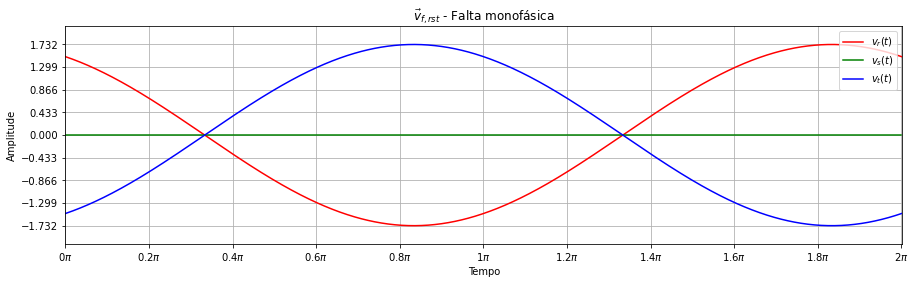

In [ ]:
# Definindo a sequência negativa
vn1={"r":np.cos(theta),"s":np.cos(theta+2*np.pi/3),"t":np.cos(theta-2*np.pi/3)}
# Definindo o vetor resultante
vf=addRST(v,vn1)
# Plotando a resultante
plotRST(vf,title=r'$\vec{v}_{f,rst}$ - Falta monofásica');

No referencial estacionário o vetor resultante é:

In [ ]:
Vf=VecSpace(vf,theta,hs={1:rst2ab(v),-1:rst2ab(vn1)})

In [ ]:
Vf.cometLG(r'$\vec{v}_{f,\alpha\beta}$ - Falta monofásica')

GridspecLayout(children=(Output(layout=Layout(grid_area='widget001')), Output(layout=Layout(grid_area='widget0…

E no referencial síncrono da fundamental:

In [ ]:
Vf.park()

In [ ]:
Vf.cometLG(r'$\vec{v}_{f,dq}$ - Falta monofásica')

GridspecLayout(children=(Output(layout=Layout(grid_area='widget001')), Output(layout=Layout(grid_area='widget0…

**Explicação:**

Na falta, o sinal está na pior condição de desequilíbrio possível, onde a sequência postiva é igual a sequência negativa. No referencial estacionário **a elipse se estica tanto que se torna uma reta** que varia apenas o môdulo e inverte de fase quando passa na origem.

No eixo $dq$ a fundamental está parada no tempo, portanto deslocando a origem do círculo. A sequência negativa gira com o dobro da velocidade, pois a sua velocidade é negativa e a transformada de Park aumenta a sua velocidade.

# Sinal de arquivo csv

O sinal abaixo é o sinal de corrente na saída de um conversor back-to-back de um DFIG (ou retificador) obtido através da medição com osciloscópio.

O sinal foi salvo em um osciloscópio e será carregado a seguir:

In [ ]:
df=pd.read_csv("voltage_current.csv")
df.set_index('time')

,ir,is,it,vr,vs,vt
time,,,,,,
0.000000,0.000000,0.000000,0.000000,0.000000e+00,-0.866025,0.866025
0.003142,0.018850,-0.032453,0.032453,3.141587e-03,-0.867592,0.864450
0.006283,0.037748,-0.064931,0.064881,6.283144e-03,-0.869150,0.862867
0.009425,0.056697,-0.097433,0.097285,9.424638e-03,-0.870699,0.861275
0.012566,0.075694,-0.129959,0.129663,1.256604e-02,-0.872240,0.859674
...,...,...,...,...,...,...
6.270619,0.075892,-0.850613,0.887819,-1.256604e-02,-0.859674,0.872240
6.273761,0.056845,-0.845268,0.882671,-9.424638e-03,-0.861275,0.870699
6.276902,0.037847,-0.839947,0.877498,-6.283144e-03,-0.862867,0.869150


Neste arquivo tem-se os sinais de tensão e de corrente.

## Sinal de tensão

Inicialmente será plotado o sinal de tensão:

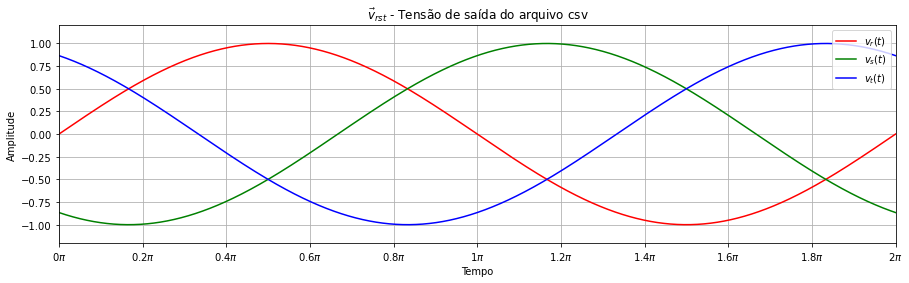

In [ ]:
vcsv={"r":df.vr,"s":df.vs,"t":df.vt}
plotRST(vcsv,
          title=r'$\vec{v}_{rst}$ - Tensão de saída do arquivo csv',
          args={'T':2000});

No referencial estacionário:

In [ ]:
Vcsv=VecSpace(vcsv,theta=np.linspace(0,2*np.pi,df.vr.size),T=2000,origem=True)

In [ ]:
Vcsv.cometLG(r"$\vec{v}_{\alpha\beta}$")

GridspecLayout(children=(Output(layout=Layout(grid_area='widget001')), Output(layout=Layout(grid_area='widget0…

E no referencial síncrono:

In [ ]:
Vcsv.park()

In [ ]:
Vcsv.cometLG(r"$\vec{v}_{dq}$")

GridspecLayout(children=(Output(layout=Layout(grid_area='widget001')), Output(layout=Layout(grid_area='widget0…

**Explicação:**

O sinal de tensão é normal e apresenta apenas a sequência positiva sem harmônicos.

## Sinal de corrente

Faremos o mesmo para a corrente:

No domínio do tempo:

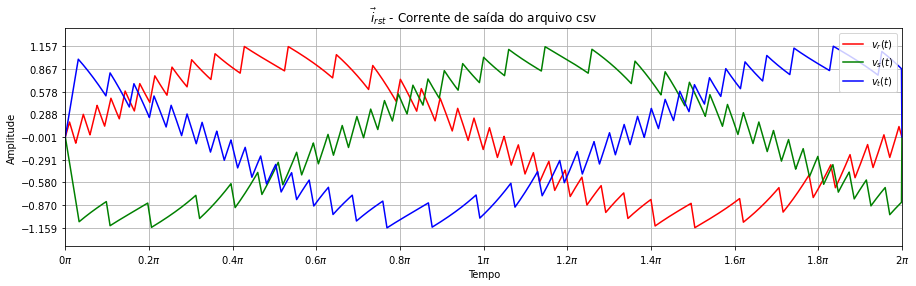

In [ ]:
icsv={"r":df["ir"],"s":df["is"],"t":df["it"]}
plotRST(icsv,
          title=r'$\vec{i}_{rst}$ - Corrente de saída do arquivo csv',
          args={'T':2000});

No referencial estacionário:

In [ ]:
Icsv=VecSpace(icsv,theta=np.linspace(0,2*np.pi,df.vr.size),T=2000)

In [ ]:
Icsv.cometLG(r"$\vec{i}_{\alpha\beta}$")

GridspecLayout(children=(Output(layout=Layout(grid_area='widget001')), Output(layout=Layout(grid_area='widget0…

E no referencial síncrono:

In [ ]:
Icsv.park()

In [ ]:
Icsv.cometLG(r"$\vec{i}_{dq}$")

GridspecLayout(children=(Output(layout=Layout(grid_area='widget001')), Output(layout=Layout(grid_area='widget0…

# Onda de corrente de um retificador trifásico

O sinal de corrente de um retificador trifásico pode ser calculado através da equação abaixo:

$$
i(t)=A\sin(\omega t)+\sum_{k=1}^{K}A\frac{(-1)^k}{6k\pm 1}\sin\left[(6k\pm 1)\omega t\right]
$$

Para gerar este sinal vamos será utilizada a função `iret()`:

In [ ]:
def iret(t,H=13):
    i=dict()
    ih=dict()
    fases=["r","s","t"]
    delay={"r":0,"s":-2*np.pi/3,"t":2*np.pi/3}

    K=np.arange(1,np.ceil(H/6))
    hs=np.sort(np.r_[1,6*K+1,6*K-1])
    Ah=np.r_[1,(-1)**np.repeat(K,2)/hs[1:]]

    i_={"r":dict(),"s":dict(),"t":dict()}
    for k, h in enumerate(hs):
        for fase in fases:
            c=Ah[k]*np.sin(h*(t+delay[fase]))
            i_[fase][h]=np.r_[c,c,0*c,0*c,0.5*c,0.5*c]
        ih[h]=rst2ab({"r":i_["r"][h],"s":i_["s"][h],"t":i_["t"][h]})
    for fase in fases:
        i[fase]=np.array(list(i_[fase].values())).sum(axis=0)
    return i, ih

In [ ]:
t=np.linspace(0,2*np.pi,1001)
hs=[13,301,3001]
i=dict()
ih=dict()

for h in hs:
    i[h], ih[h] = iret(t,h)
    
t0=np.linspace(0,6*2,i[13]["r"].size)

Finalmente, o sinal é plotado logo abaixo:

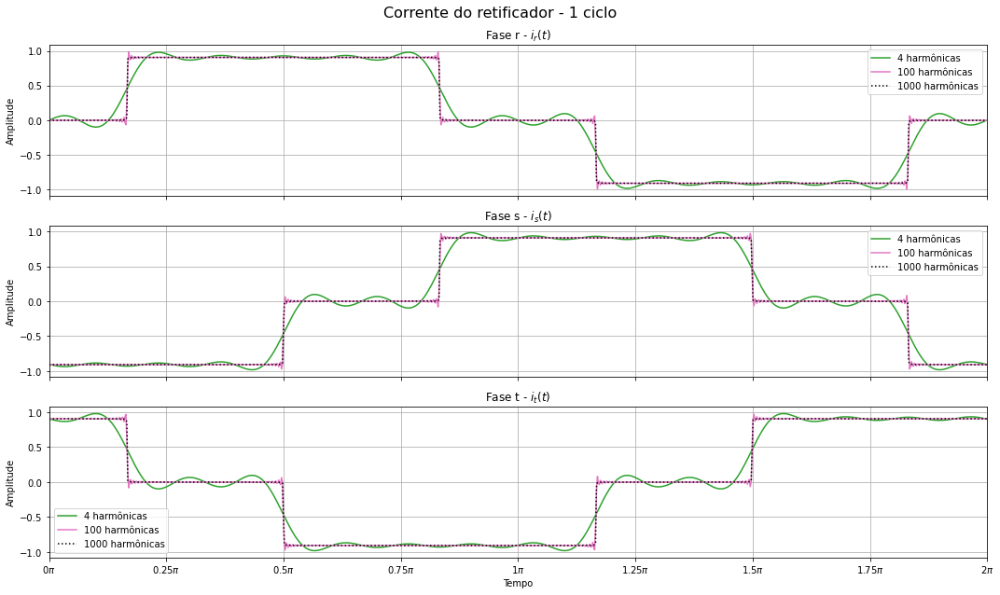

In [ ]:
fig, axs = plt.subplots(3,figsize=(15,9),sharex='col')
cores = {hs[0]:{'color':"tab:green"},
         hs[1]:{'color':"tab:pink"},
         hs[2]:{'color':"k","linestyle":":"}}
fases = ['r','s','t']
for k, ax in enumerate(axs):
    for h in hs:
        qtd=len(ih[h].keys())-1
        ax.plot(t0,i[h][fases[k]],**cores[h],label=fr"{qtd} harmônicas")
    ax.grid(True)
    ax.set_xlim(0,2);
    ax.xaxis.set_major_formatter(tck.FormatStrFormatter('%g$\pi$'));
    ax.set_ylabel('Amplitude');
    ax.set_title(fr'Fase {fases[k]} - $i_{fases[k]}(t)$');
    ax.legend();
plt.xlabel('Tempo');
fig.suptitle("Corrente do retificador - 1 ciclo",fontsize=16);
plt.tight_layout();

Considerando o ciclo completo:

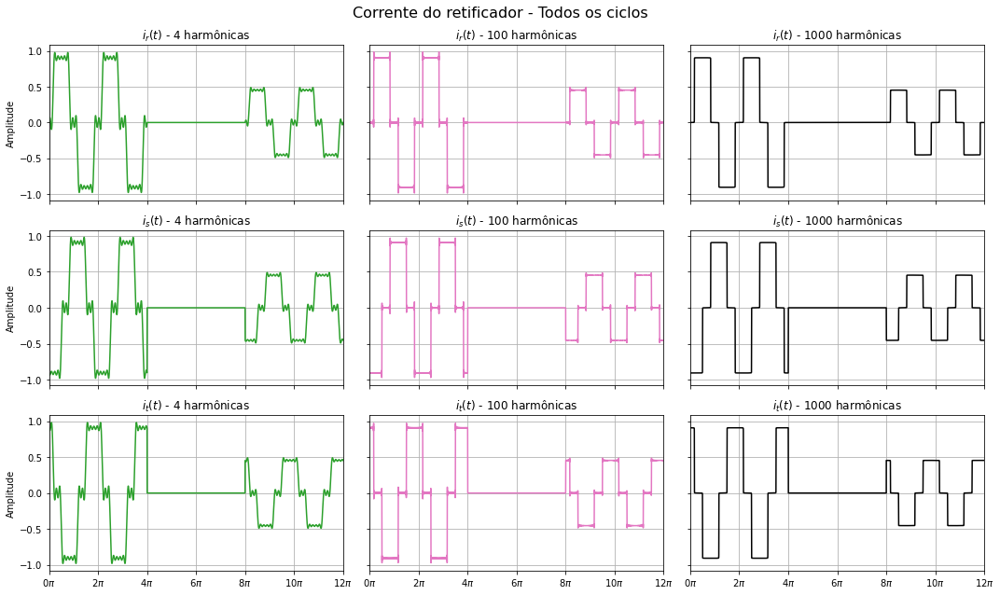

In [ ]:
fig, ax = plt.subplots(3,3,figsize=(15,9),sharex='col',sharey='row')
cores[hs[2]]={'color':"k"}
for v, fase in enumerate(fases):
    for w, h in enumerate(hs):
        ax[v,w].plot(t0,i[h][fase],**cores[h])
        qtd=len(ih[h].keys())-1
        ax[v,w].set_title(fr'$i_{fase}(t)$ - {qtd} harmônicas')
        ax[v,w].set_xlim(t0[0],t0[-1]);
        ax[v,w].xaxis.set_major_formatter(tck.FormatStrFormatter('%g$\pi$'));
        ax[v,w].grid(True);
        if w==0:
            ax[v,w].set_ylabel('Amplitude');
fig.suptitle("Corrente do retificador - Todos os ciclos",fontsize=16);
fig.tight_layout();

Além da onda de corrente, definimos **a onda de tensão que será utilizada para calcular o referencial síncrono**. Visto que, geralmente a corrente é menos estável que a tensão, podendo ter harmônicos, variação de amplitude e outras variáveis que **dificultam a estimação através de um PLL**.

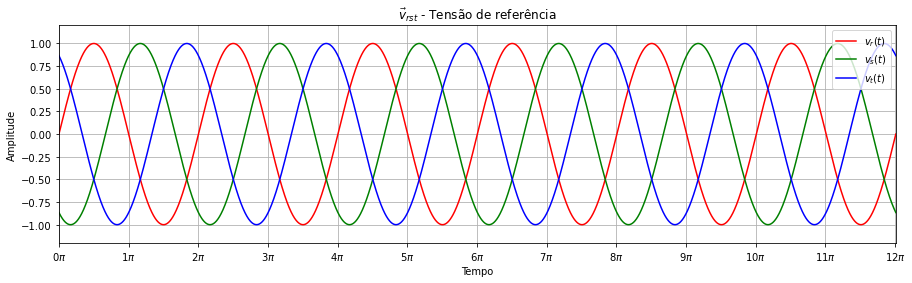

In [ ]:
v={"r":np.sin(t0*np.pi),"s":np.sin(t0*np.pi-2*np.pi/3),"t":np.sin(t0*np.pi+2*np.pi/3)}
p=plotRST(v,
          title=r'$\vec{v}_{rst}$ - Tensão de referência',
          args={'T':1000});
p.axs.set_xticks(np.arange(0,13));

## Referencial estacionário

Primeiramente plotaremos no domínio do tempo através da expressão abaixo:

$$
i(t)=\frac{2}{3}\left(i_{r}(t)+i_{s}(t)e^{j\frac{2}{3}\pi}+i_{t}(t)e^{-j\frac{2}{3}\pi}\right)
$$

In [ ]:
for h in hs:
    i[h]["vec"]=VecSpace(i[h],theta=t0*np.pi,velLim=6.5,velNonLinear=False,hs=ih[h],vref=v,limiar=0.9,origem=True)

In [ ]:
def plotHarmônicasTempo(eixos):
    fig, ax = plt.subplots(2,3,figsize=(15,6),sharex='col',sharey='row');
    
    funab=[np.real,np.imag]
    
    for w, h in enumerate(hs):
        for v in [0,1]:
            ax[v,w].plot(t0,funab[v](i[h]["vec"].ab),**cores[h]);
            ax[v,w].grid(True);
            ax[v,w].set_xlim(t0[0],t0[-1]);
            ax[v,w].xaxis.set_major_formatter(tck.FormatStrFormatter('%g$\pi$'));
            qtd=len(ih[h].keys())-1
            ax[v,w].set_title(fr'Eixo ${eixos[v]}$ - $i_{eixos[v]}(t)$ - {qtd} harmônicas');
            if w==0:
                ax[v,w].set_ylabel('Amplitude');
    plt.tight_layout();

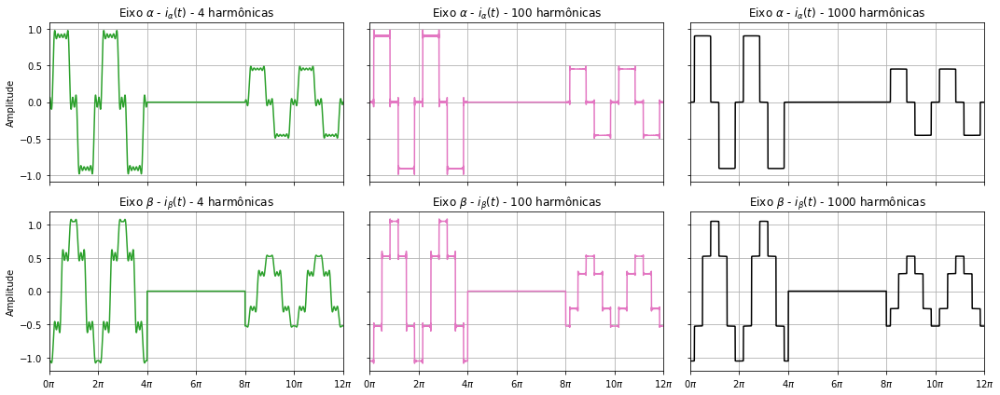

In [ ]:
eixos=[r'\alpha',r'\beta']
plotHarmônicasTempo(eixos)

Posteriormente plotamos o lugar geométrico através da família de métodos `plotLG()`:

In [ ]:
def plotHarmônicas(eixos,referencial):
    fig, ax = plt.subplots(1,3,figsize=(15,6.5),sharey='row')

    ax[0].set_ylabel(f'Eixo ${eixos[1]}$');
    for w, h in enumerate(hs):
        i[h]["vec"].plotLGSimple(fig,ax[w],colorbar=False)
        ax[w].set_xlabel(f'Eixo ${eixos[0]}$');
        qtd=len(ih[h].keys())-1
        ax[w].set_title(fr'{qtd} harmônicas')
    fig.suptitle(fr"Lugar geométrico no referencial {referencial} (${eixos[0]}{eixos[1]}$)"+"\n",fontsize=16);
    plt.tight_layout();
    plt.subplots_adjust(wspace=-0.1);
    jet=plt.get_cmap('jet')
    norm = mpl.colors.Normalize(vmin=-6.5, vmax=6.5)
    cbar=fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=jet),ax=ax,orientation='horizontal',pad=0.1,aspect=60)
    cbar.set_label('Derivada angular')
    cbar.set_ticks(np.linspace(-6,6,6*2+1))

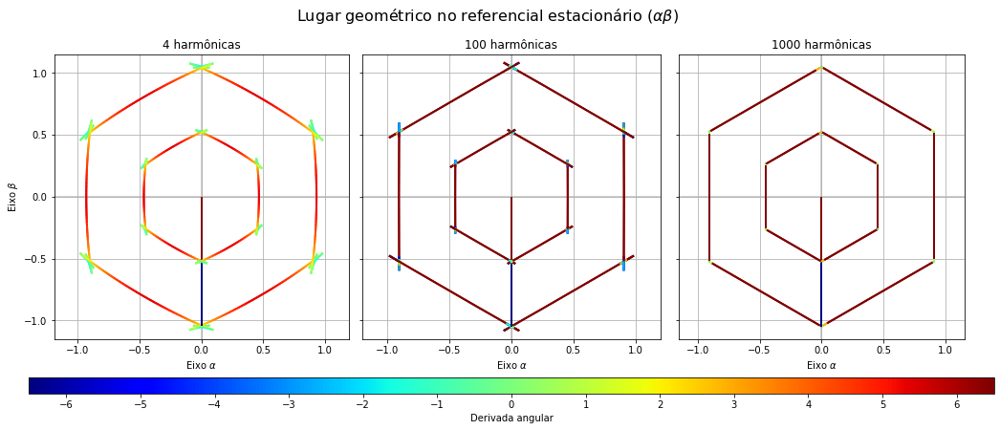

In [ ]:
plotHarmônicas(eixos,'estacionário');

E as animações através do método `comet()`:

In [ ]:
for h in hs:
    qtd=len(ih[h].keys())-1
    i[h]["vec"].cometLG(fr'$i_{{\alpha\beta}}(t)$ - {qtd} harmônicas');

GridspecLayout(children=(Output(layout=Layout(grid_area='widget001')), Output(layout=Layout(grid_area='widget0…

GridspecLayout(children=(Output(layout=Layout(grid_area='widget001')), Output(layout=Layout(grid_area='widget0…

GridspecLayout(children=(Output(layout=Layout(grid_area='widget001')), Output(layout=Layout(grid_area='widget0…

**Explicação:**

No sistema  o lugar geometríco dos vetores espaciais tem formato de hexagono. Esse formato é mais evidente à medida que inclui-se mais harmônicas na construção do vetor $\vec{i}$. No modelo com 1000 harmônicas o vetor espacial 'estaciona' nas arestas do hexagono, passando aproximadamente 1/6 do período em cada uma das arestas a mudança de uma aresta para a outra é praticamente instantânea, sendo um LG com um gradiente de velocidade angular extremamente elevado. A medida que reduz-se o número de harmônicas o gradiente de velocidade torna-se mais contínuo. Além disso, aparece o fenômeno de gibbs, isto é, o vetor espacial não estaciona mais na aresta, pois o mesmo oscila em torno destes pontos.

Além disso, observando a direção de giro das harmônicas é possível observar um fenômeno interessante. Segundo [[1]](https://www.electronics-tutorials.ws/accircuits/harmonics.html) as sequências das harmônicas aparecem no seguinte formato:

| Harmônica | Fund. |  2ª  |  3ª  |  4ª  |  5ª   |  6ª  |  7ª   |  8ª  |  9ª  | 10ª  | 11ª  | 12ª  | 13ª  |
| --------: | :---: | :--: | :--: | :--: | :---: | :--: | :---: | :--: | :--: | ---- | ---- | ---- | ---- |
| Sequência |   +   |  -   |  0   |  +   | **-** |  0   | **+** |  -   |  0   | +    |**-** | 0    |**+** |

Ou seja, as harmônicas múltiplas de 3 (ou $3\omega$) não rotacionam, enquanto as harmônicas $3\omega-1$ são de sequência negativa (Giram no sentido oposto à fundamental - sentido horário) e as harmônicas de $3\omega+1$ são de sequência positiva (Giram no mesmo sentido da fundamental - sentido anti-horário).

Analisando o caso com 4 harmônicas que contém a 5ª, 7ª e a 11ª e 13ª harmônica. Percebe-se que a 5ª e 11ª giram no sentido horário (Oposto da fundamental), portanto são de sequência negativa. Já a 11ª e 13ª giram no mesmo sentido da fundamental, portanto é de sequência postiva.

Generalizando, para qualquer quantidade de harmônicas no vetor $\vec{i}$ aparecem harmônicas no formato de $6K\pm 1$, ou seja, em torno de $6\omega$ existe uma harmônica de sequência negativa ($6K-1$) e uma harmônica de sequência positiva ($6K+1$).

As **harmônicas de sequência negativa podem causar problemas de torque nas máquinas elétricas**. Enquanto as harmônicas de sequência positiva causam sobreaquecimento. As harmônicas de sequência zero não precisam ser filtradas, pois o gerador é ligado em delta.


[1] https://www.electronics-tutorials.ws/accircuits/harmonics.html

## Referencial síncrono da fundamental

Para transformar no referencial síncrono aplicamos a transformada de Park no sentido oposto da fundamental $\omega_1=1$:

$$
\vec{v}_{dq}=\vec{v}_{\alpha\beta}e^{-j\omega_1 t}
$$

O resultado é plotado na figura abaixo:

In [ ]:
for h in hs:
    i[h]["vec"].park();

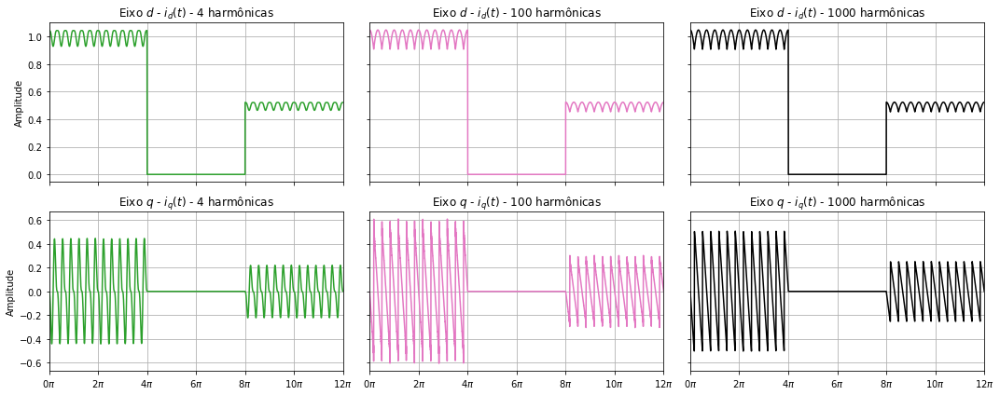

In [ ]:
eixos=['d','q']
plotHarmônicasTempo(eixos)

O lugar geométrico é apresentado abaixo:

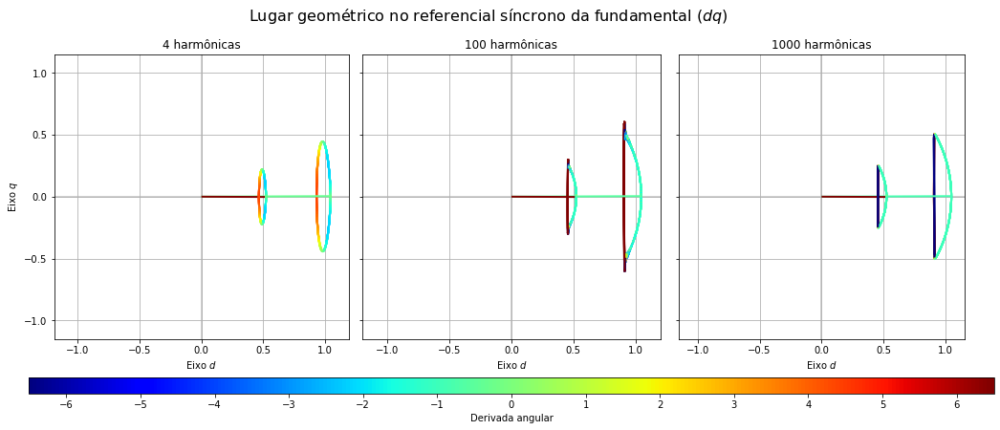

In [ ]:
plotHarmônicas(eixos,'síncrono da fundamental');

As animações são apresentadas abaixo, através do método `comet()`:

In [ ]:
for h in hs:
    qtd=len(ih[h].keys())-1
    if h==13:
        i[h]["vec"].cometLG(fr'$i_{{dq}}(t)$ - {qtd} harmônicas',args={"elip":True});
    else:
        i[h]["vec"].cometLG(fr'$i_{{dq}}(t)$ - {qtd} harmônicas');

GridspecLayout(children=(Output(layout=Layout(grid_area='widget001')), Output(layout=Layout(grid_area='widget0…

GridspecLayout(children=(Output(layout=Layout(grid_area='widget001')), Output(layout=Layout(grid_area='widget0…

GridspecLayout(children=(Output(layout=Layout(grid_area='widget001')), Output(layout=Layout(grid_area='widget0…

**Explicação:**

Para o caso de 4 harmônicas, no eixo $dq$, a harmônica de $6K+1$ (Seq. Positiva) se torna um vetor com velocidade de $6K$ enquanto a harmônica de $6K-1$ se torna um vetor com velocidade normalizada de $4K$. Como ambos tem amplitudes diferentes o lugar geometrico da soma dessas duas harmônicas em torno da vizinhança de  é uma elipse. Conclui-se, no eixo dq o LG do vetor espacial é formado pela soma de pares de harmônicas que formam elipses. No caso de 4 harmônicas, existem 2 pares de vetores, ou seja, 2 elipses, formadas pela 5ª e 7ª harmônica e pela 11ª e 13ª harmônica, respectivamente. Essa harmônica tem velocidade resultante de $-6K$ (Giro no sentido horário), pois a harmônica de sequência negativa tem amplitude maior que a harmônica de sequência positiva.

Para o caso de mais de 4 harmônicas há uma tendência de formação de um figura geométrica parecida com um arco. Isso é mais visível para o caso de 1000 harmônicas. O sentido de giro do arco continua sendo anti-horário devido a amplitude maior das harmônicas de sequência positiva. Na verdade este arco é formado pela soma de várias elipses que giram no sentido anti-horário, o número de elipses é igual ao número de harmônicas sobre dois.

Por fim, outra explicação para o formato de um arco é que uma reta no eixo $\alpha\beta$ se torna um arco no eixo $dq$ a velocidade de giro deste arco é de $-1$, pois o eixo $dq$ gira nesta mesma velocidade. Além disso, esse arco vai de $-0,5$ a $0,5$ o mesmo tamanho do segmento de reta da figura hexagonal do eixo $\alpha\beta$.

## Filtro passa baixa Butterworth

No eixo $dq$ a fundamental é apenas um vetor parado no espaço, ou seja, a componente constante das componentes $dq$. Portanto, deve-se eliminar tudo que não é constante de $d$ e $q$, que representa as harmônicas. No LG do sistema $dq$ deve-se eliminar as elipses que representam as harmônicas de velocidade normalizada de $-6K$ e $-4K$ combinadas formando uma elipse.

### O filtro Butterworth

O filtro Butterworth apresenta uma resposta bastante plana (ganho unitário) para baixas frequências (bandas de passagem) e fornece mínimo tempo de subida. Seus polos estão localizadso sobre um círculo de raio $\omega_n$, a frequência de corte do filtro, onde o ganho vale $0,5$, ou -3 dB. Além disso, seus polos são espaçados igualmente conforme o gráfico abaixo para $n$ polos (Consideranto até $n=4$):

In [ ]:
def calcAngleButter(n):
    """
    Função para cálculo de bode
    """
    dist=np.pi/(n+1);
    init=np.pi/2;
    ending=init+np.pi;
    return np.arange(init+dist,ending-0.001*np.pi,dist);

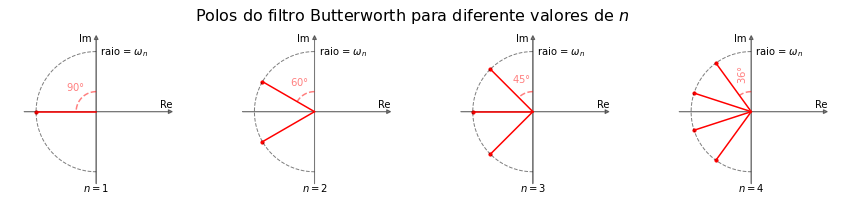

In [91]:
fig, axs = plt.subplots(1,4,figsize=(15,3))
r=0.75
theta=np.linspace(np.pi/2,np.pi/2+np.pi);

for k, ax in enumerate(axs):
    ax.grid(True)
    ax.text(0.875,0.06,'Re',ha='center');
    ax.text(-0.06,0.875,'Im',ha='right');
    ax.text(0.05,r,'raio = $\omega_n$',va='center')
    ax.text(0,-1,f'$n={k+1}$',ha='center');
    ax.axis('off');
    ax.arrow(-0.9,0,1.8,0, head_width=0.05, head_length=0.05, fc='k', ec='k',alpha=0.5);
    ax.arrow(0,-0.9,0,1.8,head_width=0.05, head_length=0.05, fc='k', ec='k',alpha=0.5);
    ax.plot(r*np.cos(theta),r*np.sin(theta),'k--',lw=1,alpha=0.5);
    for w, t in enumerate(calcAngleButter(k+1)):
        if w==0:
            theta0=np.linspace(np.pi/2,t);
            t_ = np.round(np.degrees(t))-90;
            
            ax.plot(r/3*np.cos(theta0),r/3*np.sin(theta0),'--',color='r',alpha=0.5);
            if k==3:
                args={"rotation":'vertical'}
            else:
                args={}
                
            ax.text(r/2*np.cos(theta0.mean()),r/2*np.sin(theta0).mean(),
                    f'${t_:g}$°',color='r',alpha=0.5,ha='center',va='bottom',**args)
        ax.plot([0,r*np.cos(t)],[0,r*np.sin(t)],color='r');
        ax.scatter(r*np.cos(t),r*np.sin(t),10,color='r');
    ax.axis('equal');
fig.suptitle(fr"Polos do filtro Butterworth para diferente valores de $n$",fontsize=16);

A resposta em frequência do filtro Butterworth é $20n$ dB/dec. Para demonstrar isso será poltado os gráficos de bode (Módulo e fase) para $n=1,2,3,4$ considerando $\omega_n=1$ rad/s, seguido da resposta ao degrau destes mesmos filtros:

In [ ]:
def butt_ft(n=1,wn=1):
    """
    Filtro Butterworth, com n polos e frequência de corte wn
    ------
    N, D -> Numerador e denominador do filtro
    """
    r=wn*np.exp(1j*calcAngleButter(n))
    D=np.abs(np.poly(r))
    N=D[-1]
    return N, D

In [ ]:
def setButtColorbar(fig,axs,args):
    # Colorbar
    cmap = mpl.colors.ListedColormap(butt_colors)
    norm =  mpl.colors.BoundaryNorm(np.arange(5)+0.5, cmap.N)
    cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),ax=axs,**args)
    cbar.set_label(r'$n$ $\rightarrow$ Ordem do filtro')
    cbar.set_ticks(np.arange(1,5))

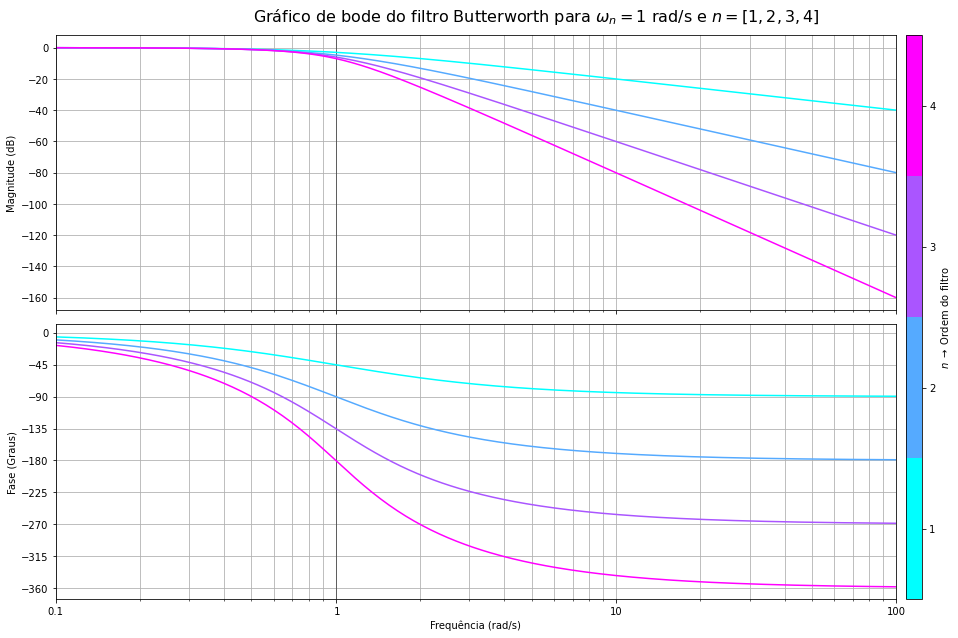

In [ ]:
sys=list()
fig, axs = plt.subplots(2,1,figsize=(15,9),sharex=True)
ylabel=['Magnitude (dB)','Fase (Graus)']
butt_colors= plt.cm.cool(np.arange(4)/3); 
for w in [0,1]:
    axs[w].grid(True, which="both", ls="-");
    axs[w].set_ylabel(ylabel[w]);
    axs[w].set_xlim(0.1,100);
    axs[w].axvline(x=1,ls='-',lw=1,c='black',alpha=0.5);
for k in range(4):
    sys.append(signal.TransferFunction(*butt_ft(k+1)));
    w, mag, phase = sys[k].bode(w=np.logspace(-1,2,301))
    axs[0].semilogx(w,mag,color=butt_colors[k]);
    axs[1].semilogx(w,phase,color=butt_colors[k]);
# axs[0].axhline(y=-3,ls='-',lw=1,c='black');
axs[0].set_yticks(np.arange(0,-170,-20));
#axs[0].set_ylim(-80,5);
axs[1].set_yticks(np.arange(0,-370,-45));
axs[1].set_xlabel('Frequência (rad/s)');
axs[1].xaxis.set_major_formatter('{x:2g}')
fig.suptitle('Gráfico de bode do filtro Butterworth para $\omega_n=1$ rad/s e $n=[1,2,3,4]$',fontsize=16);
plt.tight_layout();

# Colorbar
setButtColorbar(fig,axs,args={"pad":0.01,"aspect":35})

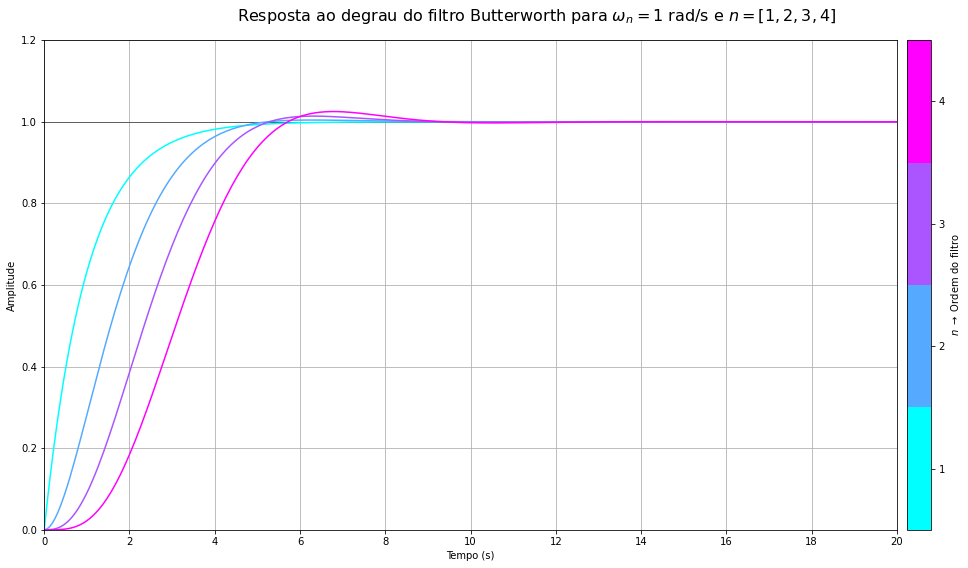

In [ ]:
fig, ax = plt.subplots(figsize=(15,8))
ax.axhline(y=1,ls='-',lw=1,c='black',alpha=0.5);
for k in range(4):
    t, y = sys[k].step(T=np.linspace(0,20,301));
    ax.plot(t,y,color=butt_colors[k])
ax.grid(True);
ax.set_ylabel('Amplitude');
ax.set_xlabel('Tempo (s)');
ax.set_xlim(0,20);
ax.set_ylim(0,1.2);
ax.set_xticks(np.arange(0,21,2));
fig.suptitle('Resposta ao degrau do filtro Butterworth para $\omega_n=1$ rad/s e $n=[1,2,3,4]$',fontsize=16);
plt.tight_layout();

setButtColorbar(fig,ax,args={"pad":0.01});

**Comportamento do filtro:**

Quando a ordem do filtro aumenta ($n$) a resposta do filtro atenua de forma mais acentuada na banda de rejeição no valor de $20n$ dB/dec. Contudo há um aumento do sobressinal e o tempo de acomodação quando aumenta a ordem filtro. O filtro que tem o tempo de subida mais rápido é o de ordem 2, pois há um atraso de transporte nos filtros de ordem maior que 1, sendo que este atraso é diretamente proporcional à ordem do filtro.

### Utilizando o filtro Butterworth para a extração de harmônicos no eixo dq

Inicialmente utilizaremos o filtro Butterworth de 2 polos (n=2) com $\omega_n=2\pi60$ rad/s para filtrar as componentes não constantes do eixo $dq$. O sinal filtrado será representado por $i_{d,f}$ e $i_{q,f}$.

A comparação entre o sinal filtrado e o sinal não filtrado é apresentado abaixo:

In [ ]:
def customizarPlotButt(v,w,tam=2):
    axs[v,w].grid(True);
    axs[v,w].set_xlim(t0[0],t0[-1]);
    axs[v,w].set_title(f'${eixo}$ - {int(h/3)} harmônicas')
    axs[v,w].legend(ncol=3);
    axs[v,w].xaxis.set_major_formatter(tck.FormatStrFormatter('%g$\pi$'));
    if w==0:
        axs[v,w].set_ylabel('Amplitude');
    if v==tam-1:
        axs[v,w].set_xlabel(r'Tempo (Ciclo $\times$ $2\pi$)');

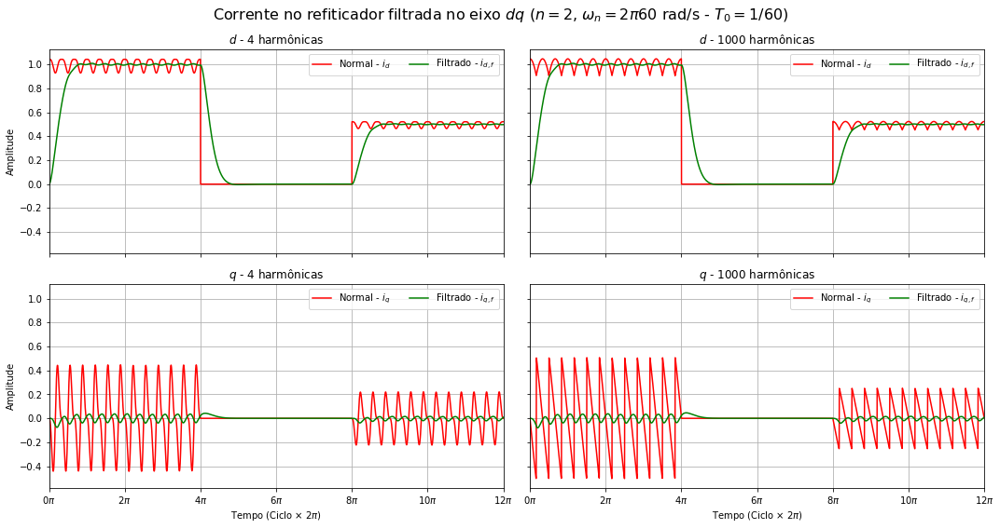

In [ ]:
sys = signal.TransferFunction(*butt_ft(n=2,wn=2*np.pi*60)) #Definindo o filtro

fig, axs = plt.subplots(2,2,figsize=(15,8),sharex=True,sharey=True)
fundq={'d':np.real,'q':np.imag} #Definindo funções do filtro
y={}
x={}
for w, h in enumerate([hs[0],hs[-1]]):
    # Cálculos
    x[h]=i[h]["vec"].ab
    tx,yd,_ = signal.lsim(sys,U=np.real(x[h]),T=t0/60) #filtragem em tempo discreto
    _ ,yq,_ = signal.lsim(sys,U=np.imag(x[h]),T=t0/60) #filtragem em tempo discreto
    y[h]=yd+1j*yq
    for v, eixo in enumerate(fundq.keys()):
        # Plotagem
        axs[v,w].plot(t0,fundq[eixo](x[h]),'r',label=fr'Normal - $i_{{{eixo}}}$')
        axs[v,w].plot(t0,fundq[eixo](y[h]),'g',label=fr'Filtrado - $i_{{{eixo},f}}$')
        # Customizações
        customizarPlotButt(v,w)
        
fig.suptitle('Corrente no refiticador filtrada no eixo $dq$ ($n=2$, $\omega_n=2\pi60$ rad/s - $T_0=1/60$)',fontsize=16);
plt.tight_layout();

**Resultado:**

Observa-se que o sinal $i_{d,f}$ e $i_{q,f}$ forma adequadamente filtrados. Sendo que $i_{d,f}$ possui amplitude unitária e $i_{q,f}$ é igual a 0 com sinais contínuos. No entanto, observa-se um pequeno atraso na resposta do sinal $i_{d,f}$ e uma pequena oscilação no sinal $i_{q,f}$. Para uma melhor resposta do filtro deve-se conciliar o tempo de resposta e filtragem das oscilações que pode ser observados no gráfico acima.

### Obtendo a corrente no filtro ativo

Para extrair os harmônicos de um determinado sinal não seinodal devemos gerar uma corrente de compensação de:

$$
i_\text{fil}(t)=-(i(t)-i_f(t))
$$

Ou seja, removemos do sinal original a componente principal.

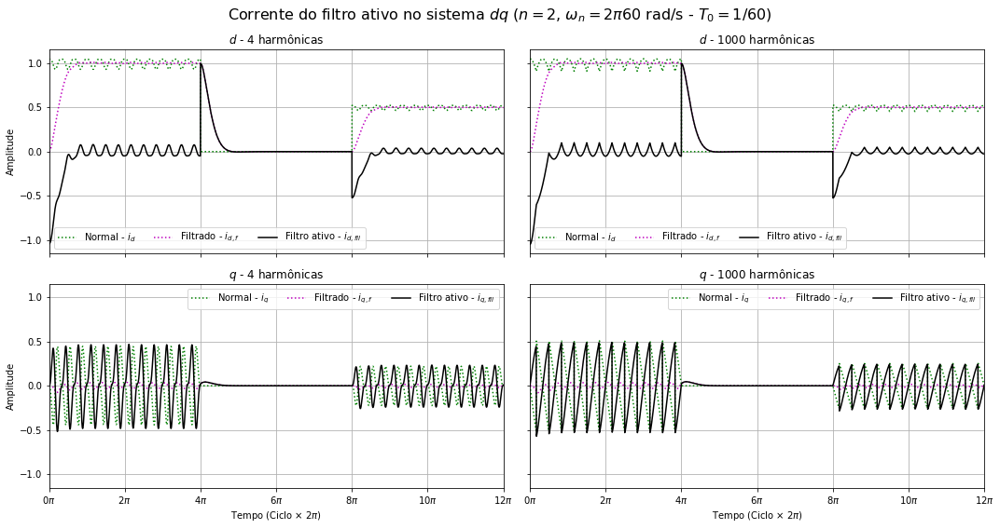

In [ ]:
fig, axs = plt.subplots(2,2,figsize=(15,8),sharex=True,sharey=True)
yfil={}
for w, h in enumerate([hs[0],hs[-1]]):
    # Cálculos
    yfil[h]= -(x[h]-y[h])
    for v, eixo in enumerate(fundq.keys()):
        # Plotagem
        axs[v,w].plot(t0,fundq[eixo](x[h]),'g:',label=fr'Normal - $i_{{{eixo}}}$')
        axs[v,w].plot(t0,fundq[eixo](y[h]),'m:',label=fr'Filtrado - $i_{{{eixo},f}}$')
        axs[v,w].plot(t0,fundq[eixo](yfil[h]),'k',label=fr'Filtro ativo - $i_{{{eixo},fil}}$')
        
        #Customizações
        customizarPlotButt(v,w)
        
fig.suptitle('Corrente do filtro ativo no sistema $dq$ ($n=2$, $\omega_n=2\pi60$ rad/s - $T_0=1/60$)',fontsize=16);
plt.tight_layout();

Para obter o sinal no sistema $\alpha\beta$ basta utilizar a transformada inversa de Park:

$$
\vec{v}_{dq}=\vec{v}_{\alpha\beta}e^{j\omega_1 t}
$$

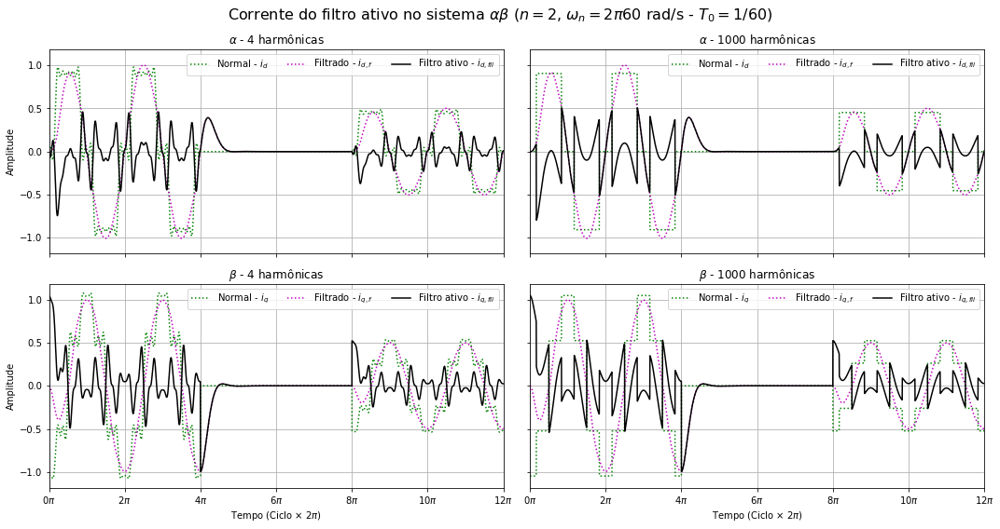

In [ ]:
fig, axs = plt.subplots(2,2,figsize=(15,8),sharex=True,sharey=True)
v0={"r":np.sin(t0*np.pi),"s":np.sin(t0*np.pi-2*np.pi/3),"t":np.sin(t0*np.pi+2*np.pi/3)}
yfilab={}
xab={}
yab={}
eixo_title=[r'\alpha',r'\beta']
for w, h in enumerate([hs[0],hs[-1]]):
    # Cálculos
    xab[h]= ab2dq(x[h],theta=t0,omega=-1,vref=v0)
    yab[h]= ab2dq(y[h],theta=t0,omega=-1,vref=v0)
    yfilab[h]= ab2dq(yfil[h],theta=t0,omega=-1,vref=v0)
    for v, eixo in enumerate(fundq.keys()):
        # Plotagem
        axs[v,w].plot(t0,fundq[eixo](xab[h]),'g:',label=fr'Normal - $i_{{{eixo}}}$')
        axs[v,w].plot(t0,fundq[eixo](yab[h]),'m:',label=fr'Filtrado - $i_{{{eixo},f}}$')
        axs[v,w].plot(t0,fundq[eixo](yfilab[h]),'k',label=fr'Filtro ativo - $i_{{{eixo},fil}}$')
        #Customizações
        customizarPlotButt(v,w)
        axs[v,w].set_title(f'${eixo_title[v]}$ - {int(h/3)} harmônicas')
        
fig.suptitle(r'Corrente do filtro ativo no sistema $\alpha\beta$ ($n=2$, $\omega_n=2\pi60$ rad/s - $T_0=1/60$)',fontsize=16);
plt.tight_layout();

Este sinal no sistema $\alpha\beta$ pode ser implementado no conversor através de uma modulação SVPWM. Outra forma seria converter o sinal do $\alpha\beta$ para o $rst$ e aplicar o sinal diretamente.

### Obtendo a corrente compensada rede

A corrente compensada da rede é dada como:

$$
i_\text{rede}(t)=i_\text{fil}(t)+i(t)
$$

Abaixo tem-se o sinal no $rst$. Optou-se por utilizar a transformada inversa de Clarke dada abaixo:


$$
\begin{bmatrix}
x_r \\ x_s \\ x_t
\end{bmatrix}=
\begin{bmatrix}
1 & -\frac{1}{2} & \frac{\sqrt{3}}{2} \\
0 & -\frac{1}{2} & -\frac{\sqrt{3}}{2}
\end{bmatrix}
\begin{bmatrix}
x_\alpha \\ x_\beta
\end{bmatrix}
$$

Esta matriz de transformação foi implementada na função `ab2rst()`. O sinal filtrado no sistema $rst$ é apresentado abaixo:

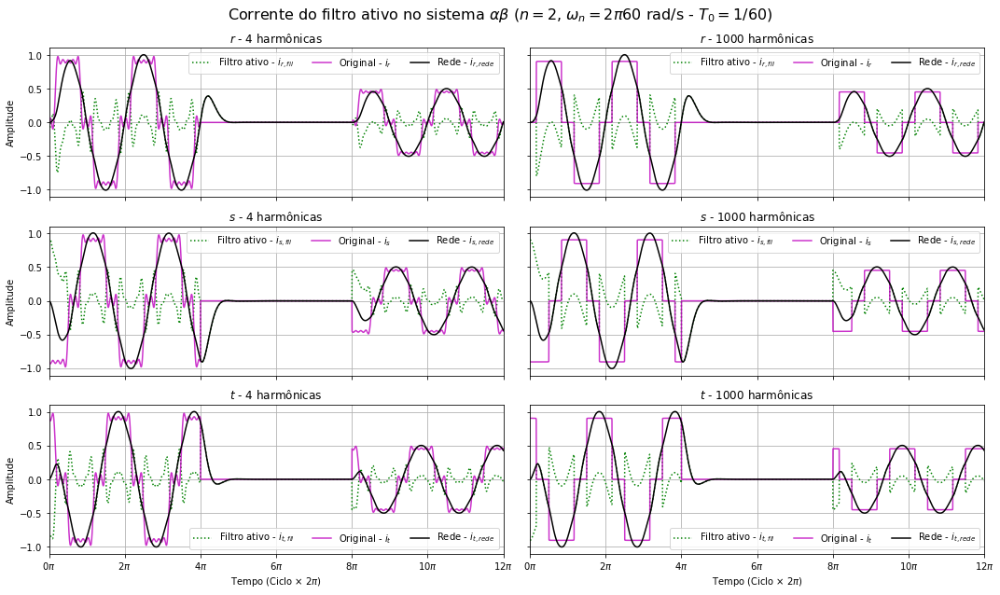

In [ ]:
fig, axs = plt.subplots(3,2,figsize=(15,9),sharex=True,sharey=True)
yfilrst={}
xrst={}
yrst={}
for w, h in enumerate([hs[0],hs[-1]]):
    # Cálculos
    xrst[h]= ab2rst(xab[h])
    yrst[h]= ab2rst(yab[h])
    yfilrst[h]= ab2rst(yfilab[h])
    for v, fase in enumerate(['r','s','t']):
        # Plotagem
        axs[v,w].plot(t0,yfilrst[h][fase],'g:',label=fr'Filtro ativo - $i_{{{fase},fil}}$')
        axs[v,w].plot(t0,xrst[h][fase],'m',label=fr'Original - $i_{{{fase}}}$',alpha=0.8)
        axs[v,w].plot(t0,yrst[h][fase],'k',label=fr'Rede - $i_{{{fase},rede}}$')
        
        
        #Customizações
        customizarPlotButt(v,w,tam=3)
        axs[v,w].set_title(f'${fase}$ - {int(h/3)} harmônicas')
        
fig.suptitle(r'Corrente do filtro ativo no sistema $\alpha\beta$ ($n=2$, $\omega_n=2\pi60$ rad/s - $T_0=1/60$)',fontsize=16);
plt.tight_layout();

**Comentário:**

Observa-se que o sinal $i_\text{rede}$ foi filtrado com um pequeno atraso no tempo de resposta e um pequeno overshoot. Não se observa-se as harmônicas neste gráfico somente no sistema $dq$ que é insignificante em relação ao sinal $i_\text{rede}$.

### Comparação do filtro Butterworth

Nesta seção iremos alterar os valores de $n$ e $\omega_n$ do filtro Butterworth e verificar a sua influência no desempenho geral analisando a resposta em frequência (Amplitude no diagrama de Bode), a resposta ao degrau e a qualidade do sinal filtrado.

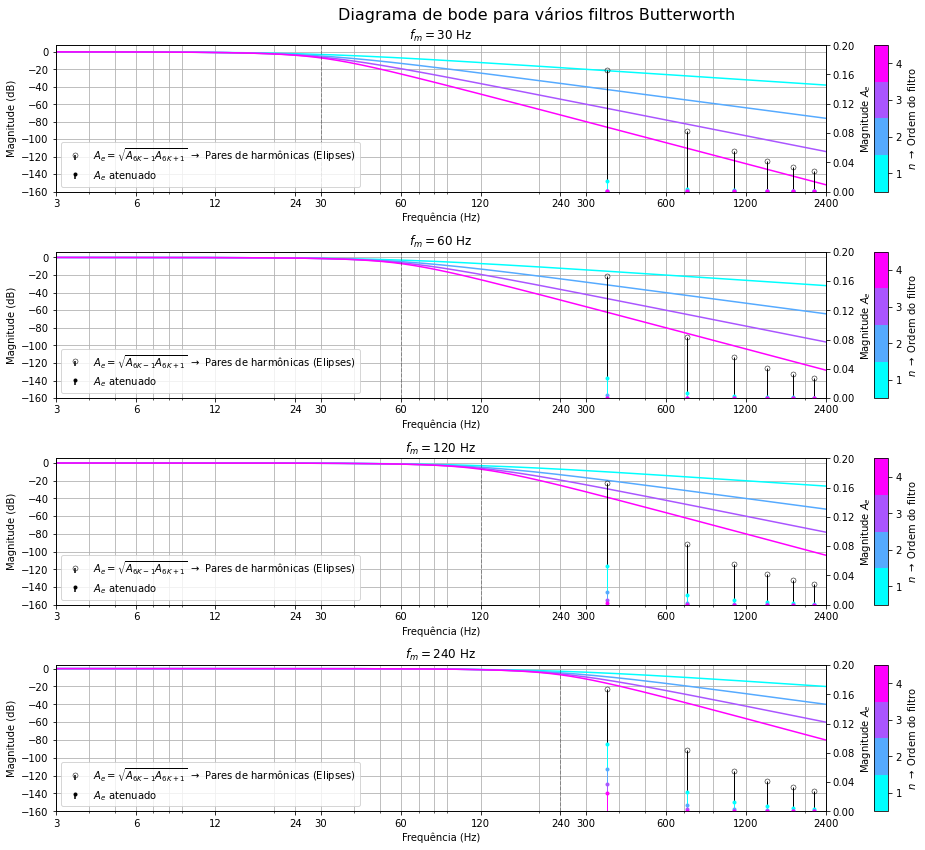

In [ ]:
fig, axs = plt.subplots(4,1,figsize=(15,12))
axst=list()
for k in range(4):
    freq=30*2**k
    for n in range(4):
        sys=signal.TransferFunction(*butt_ft(n+1,wn=2*np.pi*freq))
        w, mag, _ = sys.bode(w=2*np.pi*24*np.logspace(-1,2,301))
        axs[k].semilogx(w/2/np.pi,mag,color=butt_colors[n]);
    #Customização
    axs[k].axvline(x=freq,ls='--',lw=1,c='black',alpha=0.3);
    axs[k].set_xlim(3,2400);
    axs[k].grid(True, which="both", ls="-");
    axs[k].set_xticks(np.hstack([np.array([3,6,12,24])*10**w for w in np.arange(3)]));
    axs[k].xaxis.set_major_formatter('{x:2g}');
    axs[k].set_title(f'$f_m={freq}$ Hz')
    axs[k].set_ylabel('Magnitude (dB)');
    axs[k].set_xlabel('Frequência (Hz)');
    axs[k].set_yticks(np.arange(0,-161,-20));
    ## Segundo eixo
    axst.append(axs[k].twinx());
    # Harmônicas normais
    harmo = 6*60*np.arange(1,7)
    ah=60/np.sqrt((harmo-1)*(harmo+1))
    markerline, stemlines, baseline =axst[-1].stem(harmo,ah,linefmt='black',markerfmt='ko',
                                                       label=r'$A_e=\sqrt{A_{6K-1}A_{6K+1}}$ $\rightarrow$ Pares de harmônicas (Elipses)');
    plt.setp(stemlines, linewidth=1);
    plt.setp(markerline, markerfacecolor='none',markersize=5,markeredgewidth=0.5)
    plt.setp(baseline, linewidth=0)
    for n in range(4):    
        sys=signal.TransferFunction(*butt_ft(n+1,wn=2*np.pi*freq))
        w, mag, _ = sys.bode(w=2*np.pi*24*np.logspace(-1,2,301))
        #Harmônicas atenuadas
        fator_filtragem=10**(np.interp(harmo,w/2/np.pi,mag)/20)
        ahf=fator_filtragem*ah
        markerline, stemlines, baseline =axst[-1].stem(harmo,ahf,markerfmt='.',bottom=-1);
        plt.setp(stemlines, linewidth=1, color=butt_colors[n]);
        plt.setp(markerline, color=butt_colors[n]);
        
    # Para legenda
    markerline, stemlines, baseline =axst[-1].stem(harmo*10,ahf,linefmt='black',
                                                       markerfmt='k.',label='$A_e$ atenuado');
    plt.setp(baseline, linewidth=0);
                      
    #Customização do segundo eixo
    axst[-1].set_ylim(0,0.2);
    axst[-1].set_ylabel('Magnitude $A_e$');
    axst[-1].set_yticks(np.arange(0,0.2001,0.04));
    axst[-1].legend(loc=3);
        
fig.suptitle('Diagrama de bode para vários filtros Butterworth',fontsize=16);
plt.tight_layout();
for k in range(4):
    setButtColorbar(fig,axs[k],args={"pad":0.05,"aspect":10});

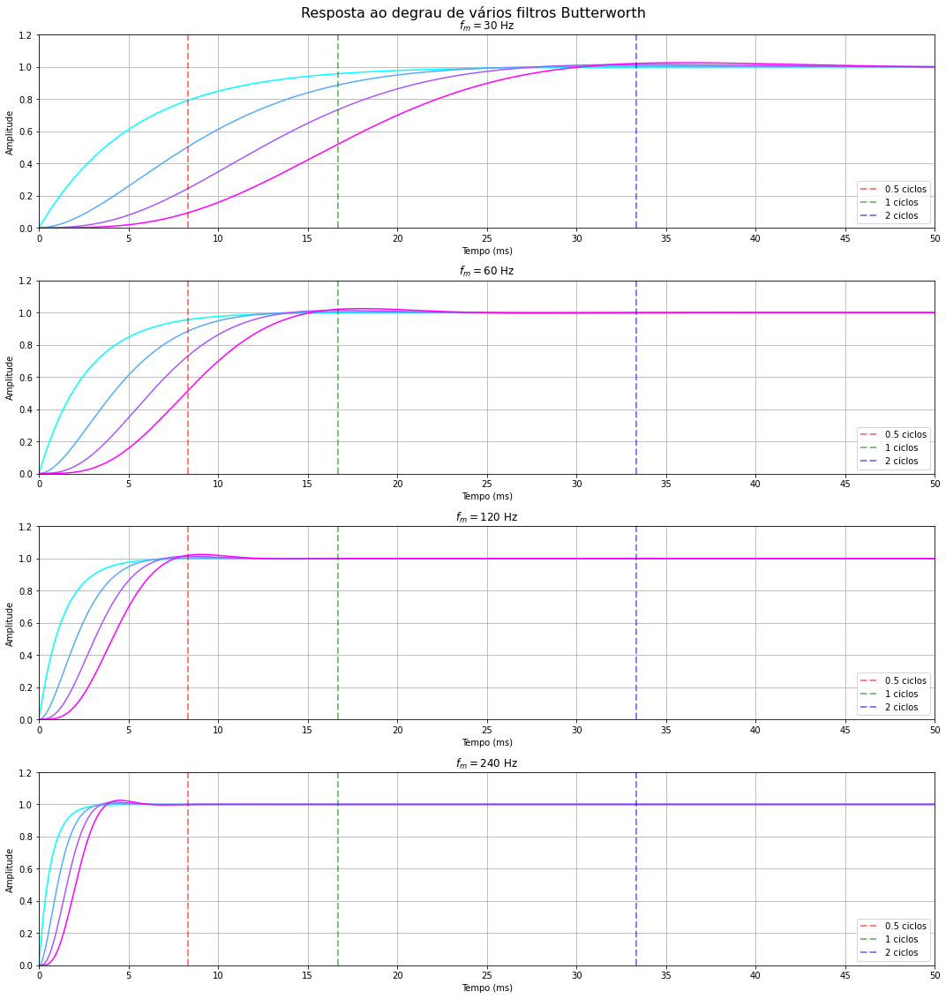

In [ ]:
fig, axs = plt.subplots(4,1,figsize=(15,16))
ciclo_cores=['r','g','b']
for k in range(4):
    freq=30*2**k
    for n in range(4):
        sys=signal.TransferFunction(*butt_ft(n+1,wn=2*np.pi*freq))
        with warnings.catch_warnings(): #Removendo os warning temporariamente
            warnings.simplefilter("ignore")
            t, y = sys.step(T=np.linspace(0,50,4*301)/1000);
        axs[k].plot(t*1000,y,color=butt_colors[n])
    
    for ciclos in range(3):
        ciclo=0.5*2**ciclos
        axs[k].axvline(x=1/60*ciclo*1000,ls='--',lw=2,c=ciclo_cores[ciclos],alpha=0.5,
                      label=f"{ciclo:g} ciclos");
    axs[k].grid(True);
    axs[k].set_ylabel('Amplitude');
    axs[k].set_xlabel('Tempo (ms)');
    axs[k].set_xlim(0,50);
    axs[k].set_ylim(0,1.2);
    axs[k].set_xticks(np.arange(0,51,5));
    axs[k].legend(loc=4);
    axs[k].set_title(f'$f_m={freq:.3g}$ Hz')
fig.suptitle('Resposta ao degrau de vários filtros Butterworth',fontsize=16);
plt.tight_layout();

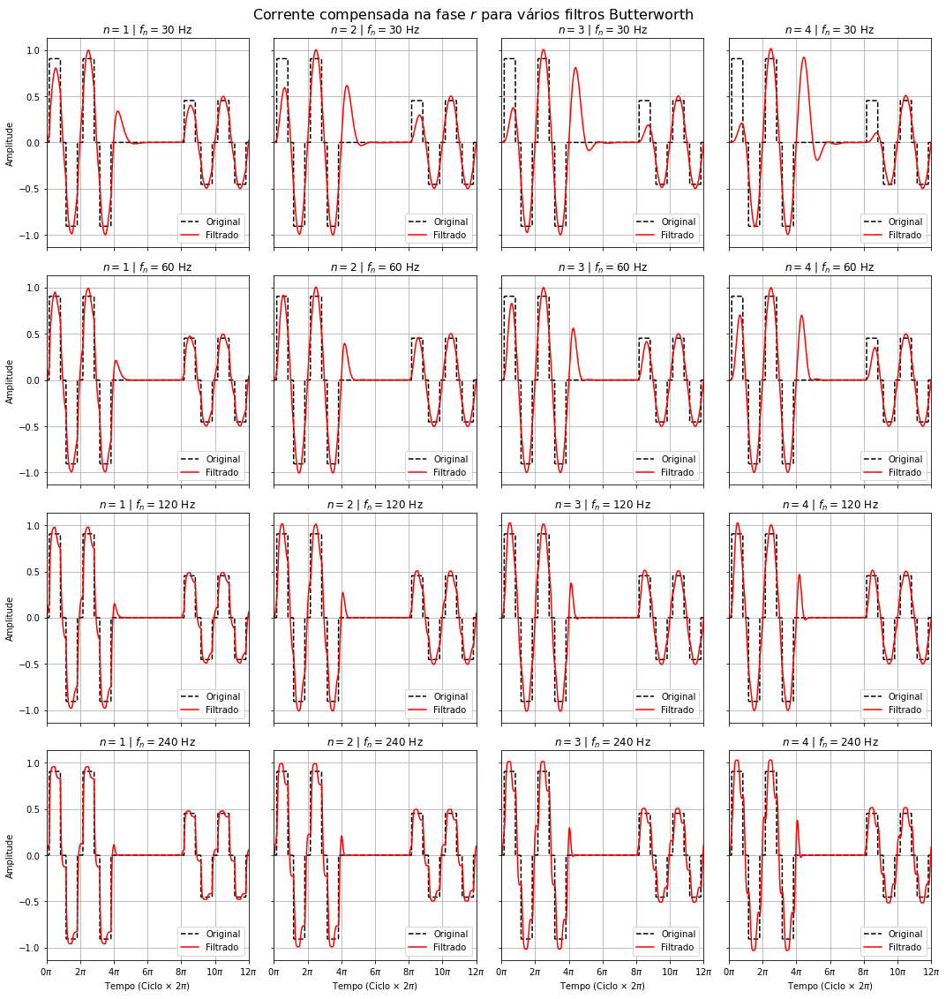

In [ ]:
fig, axs = plt.subplots(4,4,figsize=(15,16),sharex=True,sharey=True)

for k in range(4):
    freq=30*2**k
    for n in range(4):
        # Cálculos
        x=i[hs[-1]]["vec"].ab
        sys=signal.TransferFunction(*butt_ft(n+1,wn=2*np.pi*freq))
        tx,yd,_ = signal.lsim(sys,U=np.real(x),T=t0/60) #filtragem em tempo discreto
        _ ,yq,_ = signal.lsim(sys,U=np.imag(x),T=t0/60) #filtragem em tempo discreto
        y=yd+1j*yq
        yfil= -(x-y)
        yab= ab2dq(y,theta=t0,omega=-1,vref=v0)
        yrst= ab2rst(yab)
        #Plotagem
        axs[k,n].plot(t0,xrst[hs[-1]]["r"],'k--',label='Original');
        axs[k,n].plot(t0,yrst["r"],color='red',label='Filtrado');
        #Customizações
        axs[k,n].set_title(f'$n={n+1}$ | $f_n={freq:.3g}$ Hz');
        axs[k,n].set_xlim(t0[0],t0[-1]);
        axs[k,n].grid(True);
        if n==0:
            axs[k,n].set_ylabel('Amplitude');
        if k==3:
            axs[k,n].set_xlabel(r'Tempo (Ciclo $\times$ $2\pi$)');
        axs[k,n].xaxis.set_major_formatter(tck.FormatStrFormatter('%g$\pi$'));
        axs[k,n].legend(loc=4)
fig.suptitle('Corrente compensada na fase $r$ para vários filtros Butterworth',fontsize=16);
plt.tight_layout();

**Conclusão:**

Assim como esperado, ao aumentar a ordem do filtro o sinal tende a ficar mais comportado em regime permanente, porém o tempo de resposta e o sobressinal do filtro (Representado por oscilações transitórias na corrente) aumenta. 

Com frequências de corte mais baixas a atenuação das harmônicas aumenta bastante, porém o tempo de resposta reduz igualmente. Entretanto ao variar a ordem e a frequência de corte para vários filtros, escolheu-se como melhor candidato o filtro com os parâmetros $f_n=120$ Hz e $n=3$. 

Nesta configuração o tempo de resposta é de aproximadamente meio ciclo. A maior elipse no eixo dq (5ª e 7ª harmônica) tem uma amplitude média em torno de 1% depois de atenuada. Por outro lado, há um leve sobressinal no primeiro cíclo, que se estabiliza no segundo ciclo.

Uma outra configuração possível seria $f_n=60$ Hz e $n=2$, nesta configuração o tempo de resposta é aproximadamente de um ciclo, sem sobressinal, e a maior elipse no eixo de (5ª e 7ª harmônica) tem uma amplitude média menor que 1% depois de atenuada. 

Sendo assim, o melhor filtro irá depender das necessidades do projetista, se a necessidade for a melhor qualidade de sinal em regime escolhe-se $f_n=60$ Hz e $n=2$, se a necessidade for melhor no transitório escolhe-se $f_n=120$ Hz e $n=3$. Os demais candidatos não apresentam boa qualidade de sinal.

Comparando ao filtro média móvel, para a aplicação atual o filtro é excelente. Tem uma atenuação aceitáve, pode-se ter um tempo de resposta parecido (Meio ciclo) e tem a vantagem de ser menos sensível à variação de frequência, que é desejável em redes mais fracas. Por outro lado, o filtro média móvel tem a atenuação de meio ciclo, mas tem uma atenuação perfeita, desde que a frequência da rede não varie.